In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import os
import sys
current_path = os.getcwd()
parent_directory = os.path.dirname(current_path)
sys.path.append(parent_directory)
from Class.jenie import Jenie
import pandas as pd
import numpy as np
import scanpy as sc
import anndata
import umap.umap_ as umap
import leidenalg
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns
from sklearn.cluster import KMeans
from scipy.spatial.distance import pdist, squareform
from sklearn.metrics import pairwise_distances
from scipy.stats import zscore
from matplotlib.colorbar import ColorbarBase
import matplotlib.colors as mcolors
from umap import UMAP
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import silhouette_score
from kneed import KneeLocator
from sklearn.decomposition import PCA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

In [3]:
plt.style.use('dark_background')

# Generate adata files

In [4]:
edu_pos_scdata = sc.read_h5ad(r"C:\Users\krist\Cleveland Lab Group\activation_of_quiescent_neurogenic_niches_of_aging_brain\4_week_edu_pos.h5ad")
edu_pos_scdata

AnnData object with n_obs × n_vars = 5143 × 275
    obs: 'volm', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'edu_median', 'edu_mean', 'edu_pos', 'leiden', 'celltype', 'x', 'cluster_names'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'celltype_colors', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'rank_genes_groups', 'umap', 'x_colors'
    obsm: 'X_pca', 'X_raw', 'X_spatial', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [5]:
edu_4_week_ob_scdata = sc.read_h5ad(r"C:\Users\krist\Cleveland Lab Group\activation_of_quiescent_neurogenic_niches_of_aging_brain\4week_mouse_edu_labeled_onlyOB.h5ad")
edu_4_week_ob_scdata

AnnData object with n_obs × n_vars = 49170 × 275
    obs: 'volm', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'edu_median', 'edu_mean', 'edu_pos', 'leiden', 'celltype', 'x'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'celltype_colors', 'leiden', 'log1p', 'neighbors', 'umap', 'x_colors'
    obsm: 'X_raw', 'X_spatial', 'X_umap'
    obsp: 'connectivities', 'distances'

In [6]:
adata_4_week_ob_edu_pos = Jenie(edu_pos_scdata, 'edu_pos_scdata', 'edu_pos_scdata', pallete = 'edu_pos_4_week_ob')
adata_4_week_ob = Jenie(edu_4_week_ob_scdata, 'edu_4_week_ob_scdata', 'edu_4_week_ob_scdata', pallete = 'edu_4_month_ob')

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


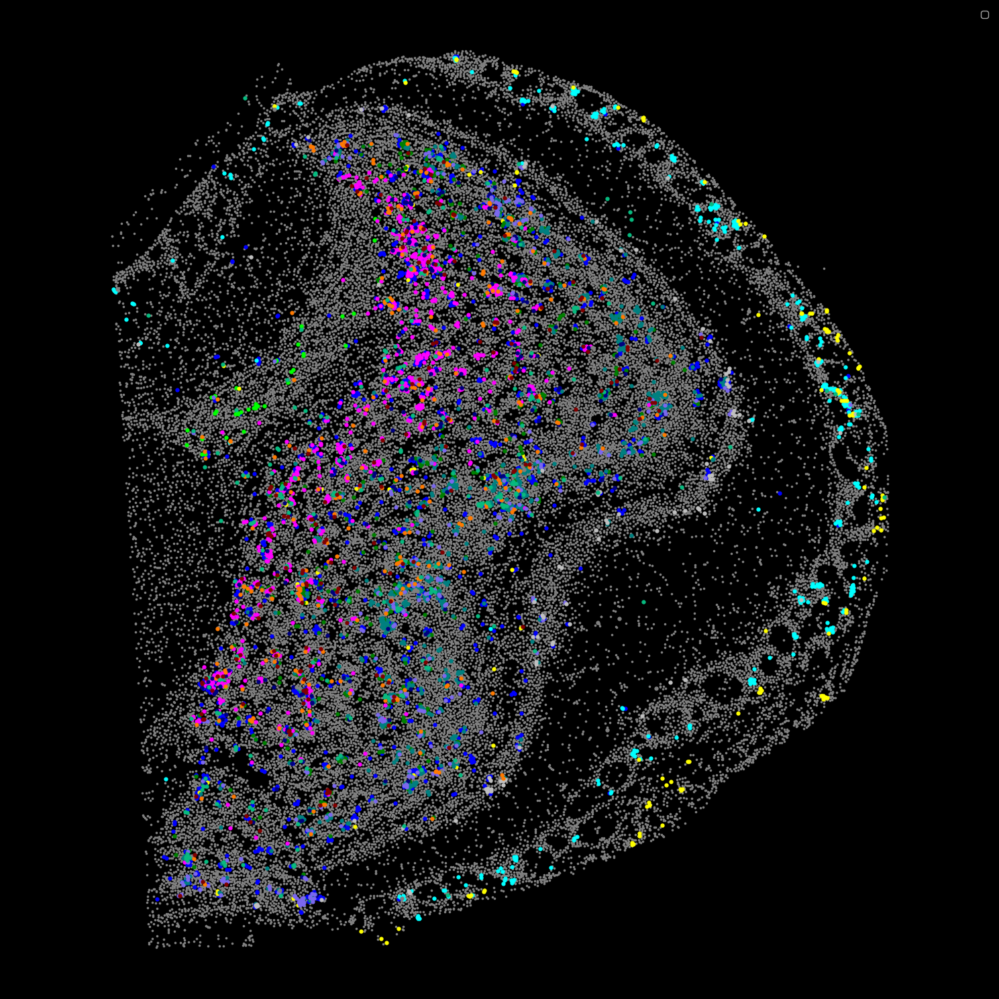

In [7]:
adata_4_week_ob_edu_pos.plot_cluster_scdata(group = 'cluster_names', ref = adata_4_week_ob, sbig = 50, ssm = 10)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that 

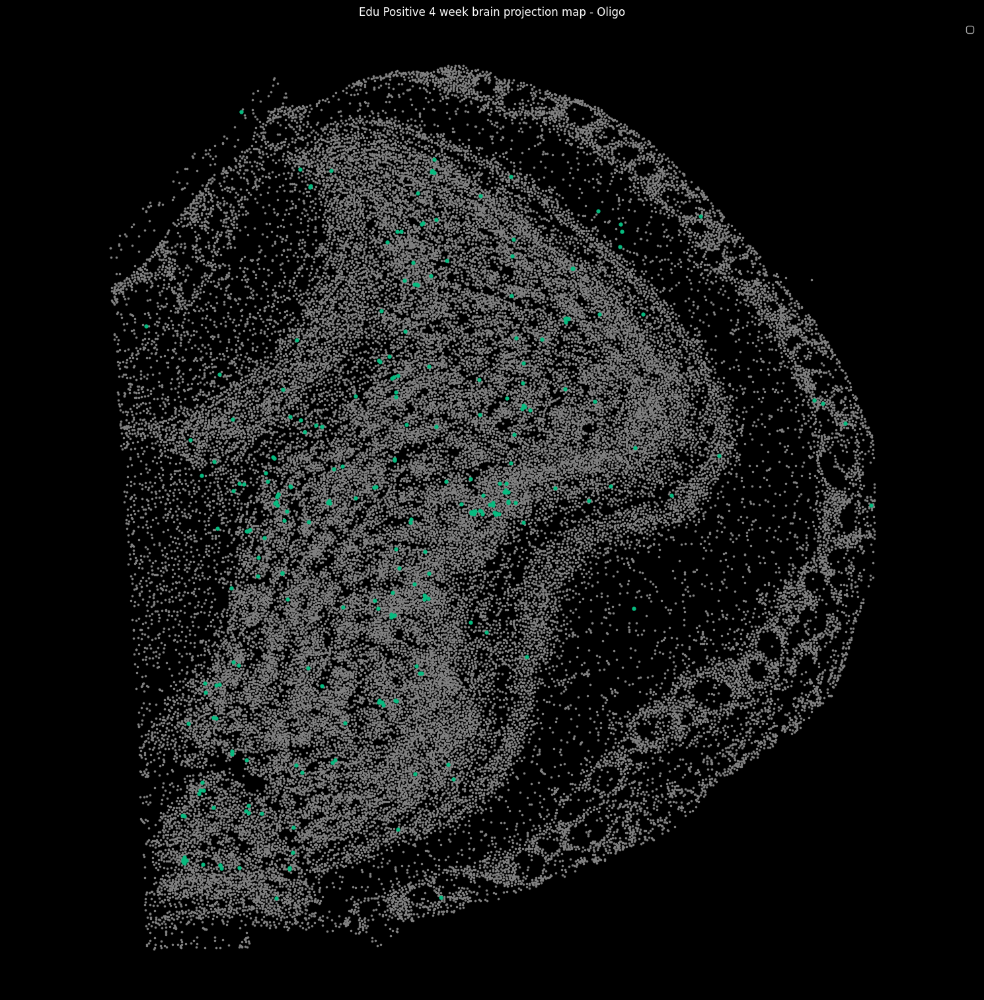

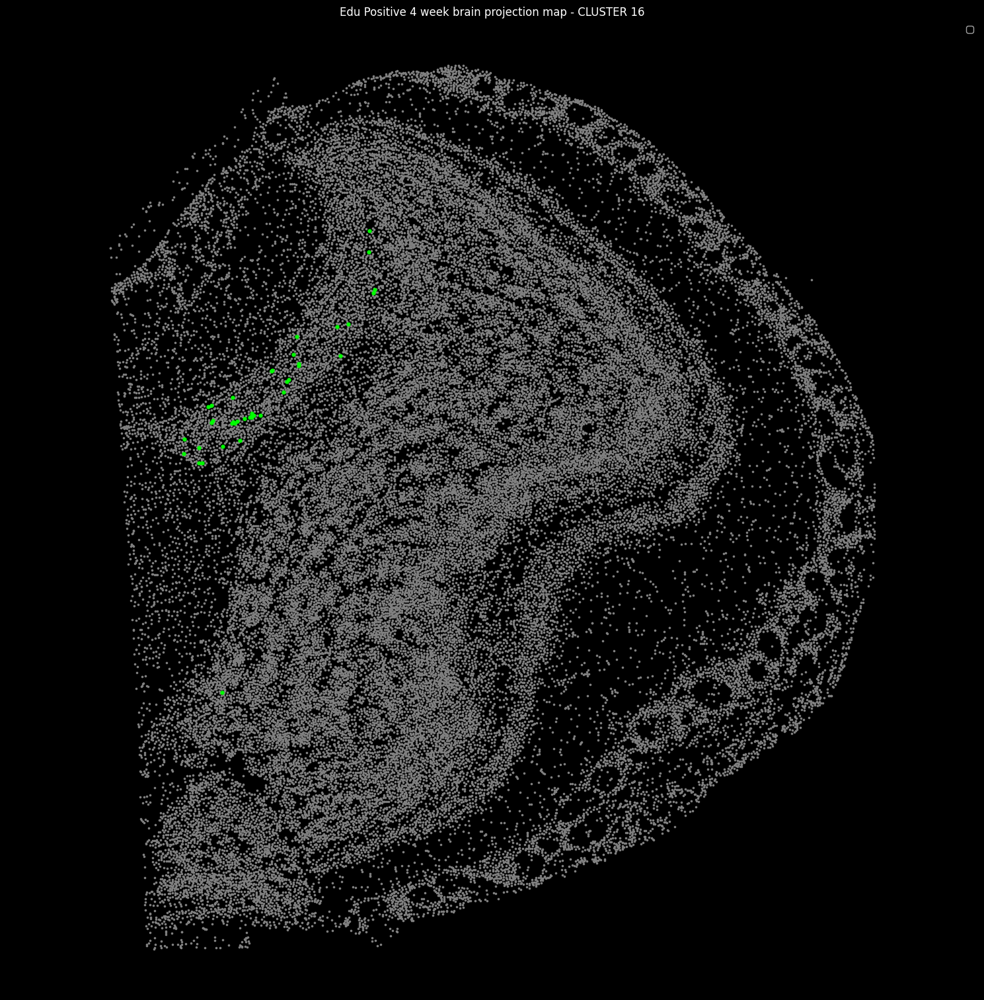

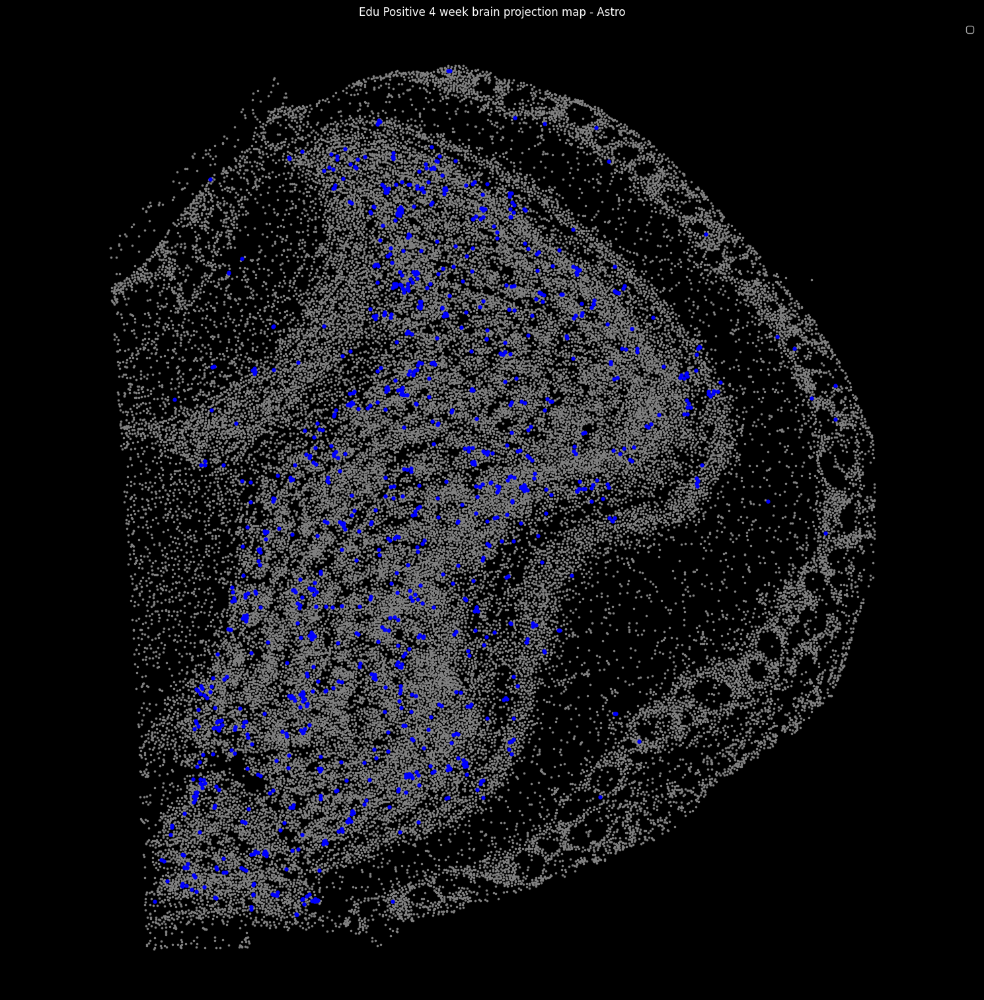

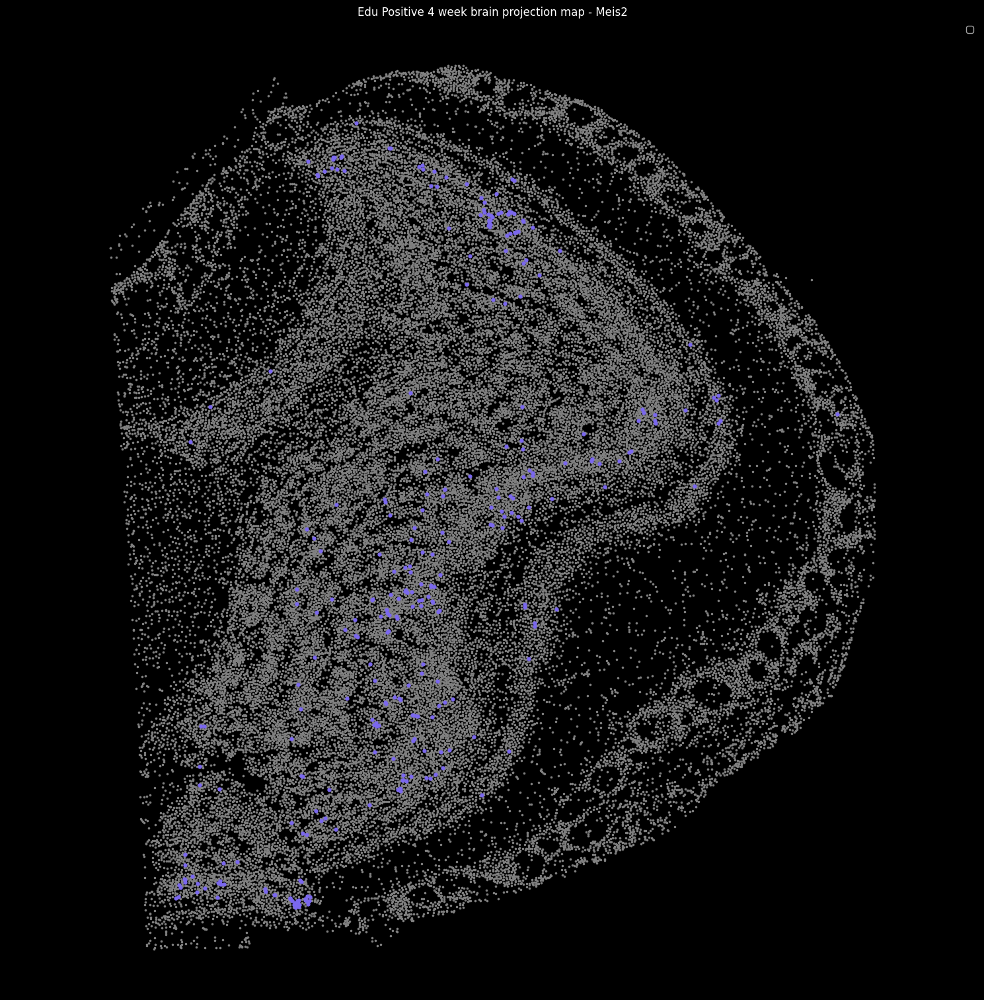

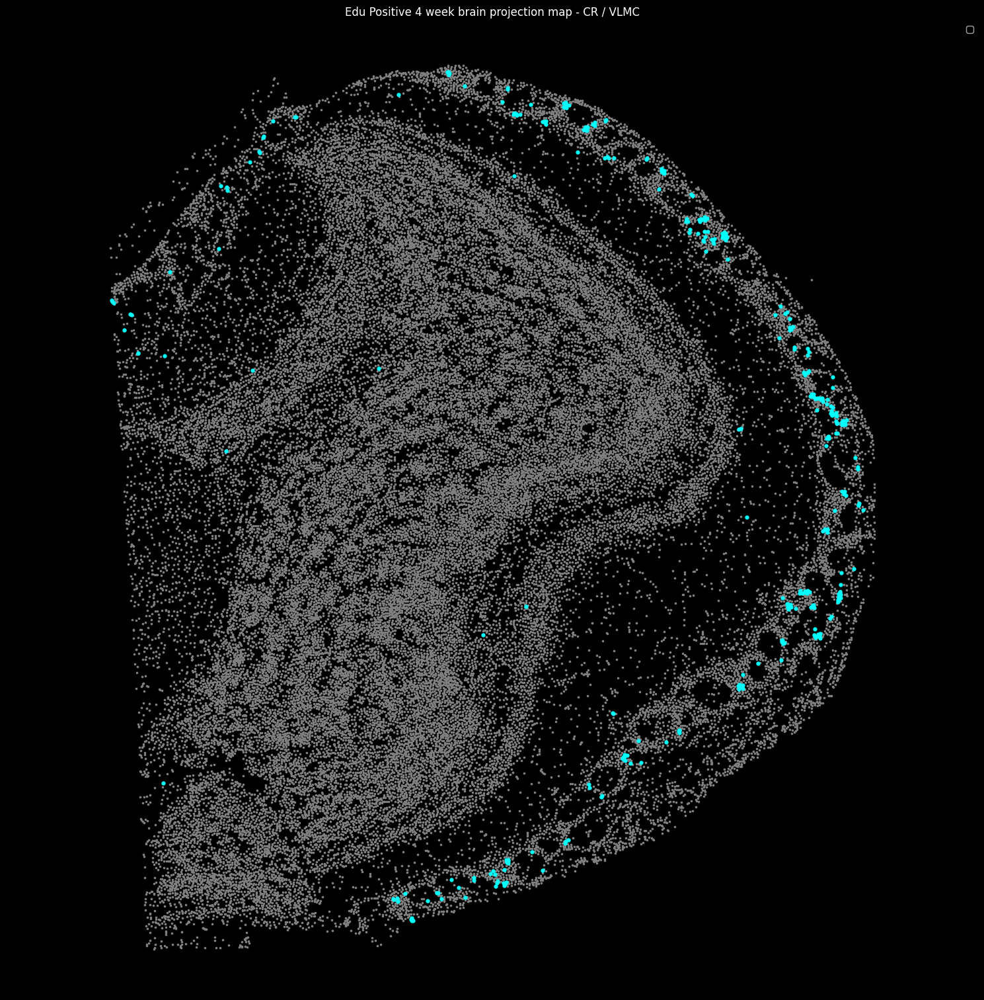

...

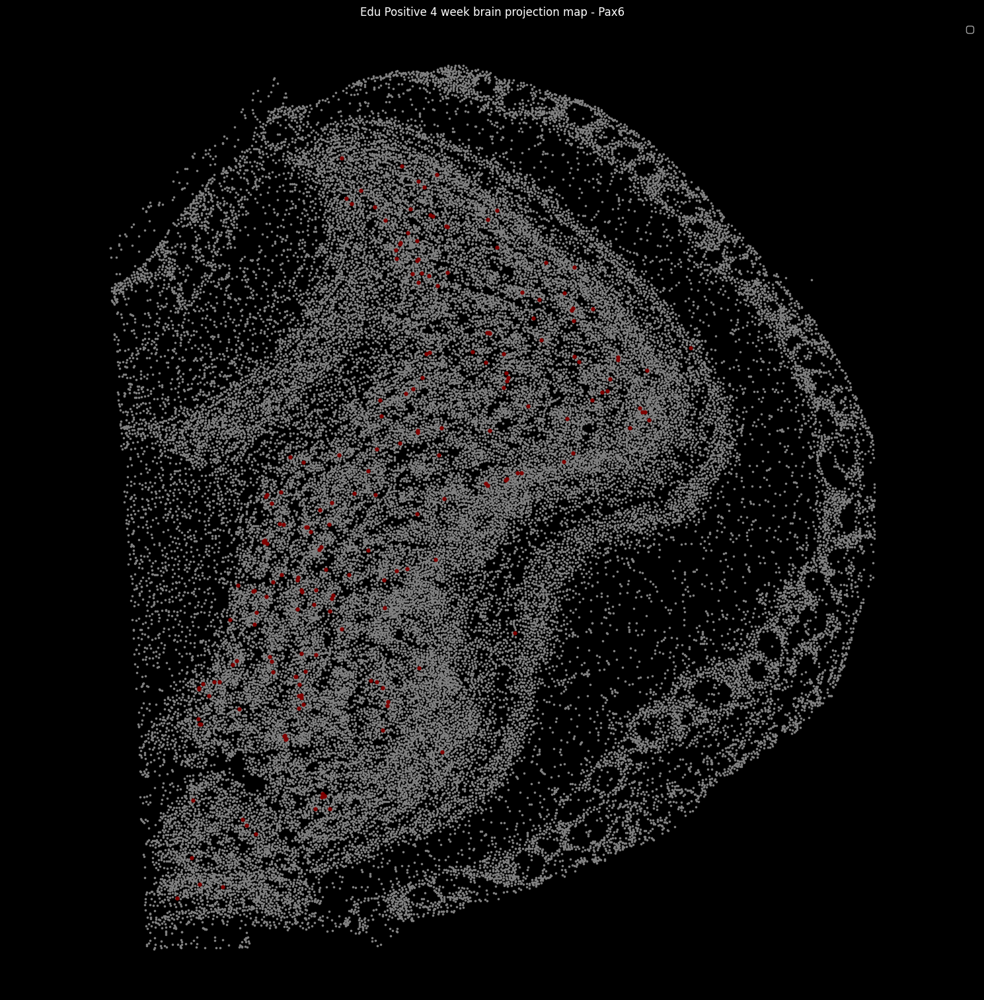

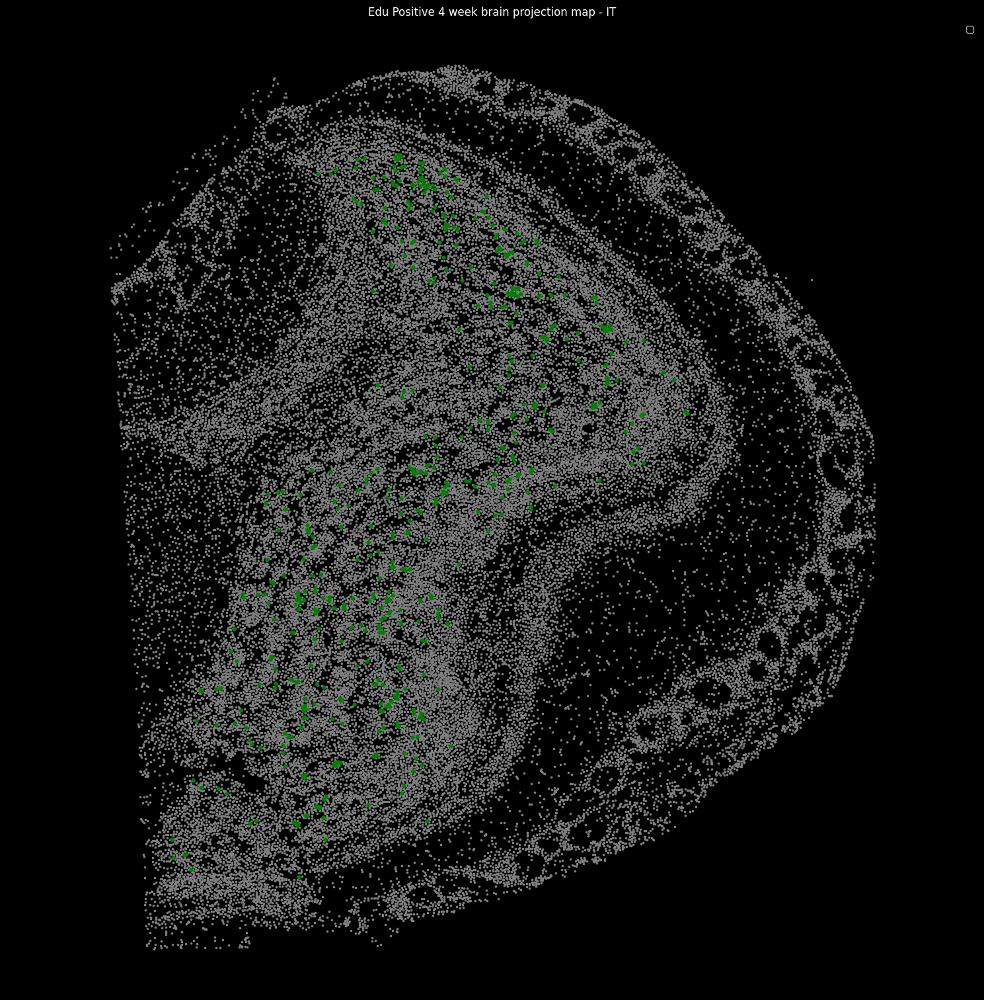

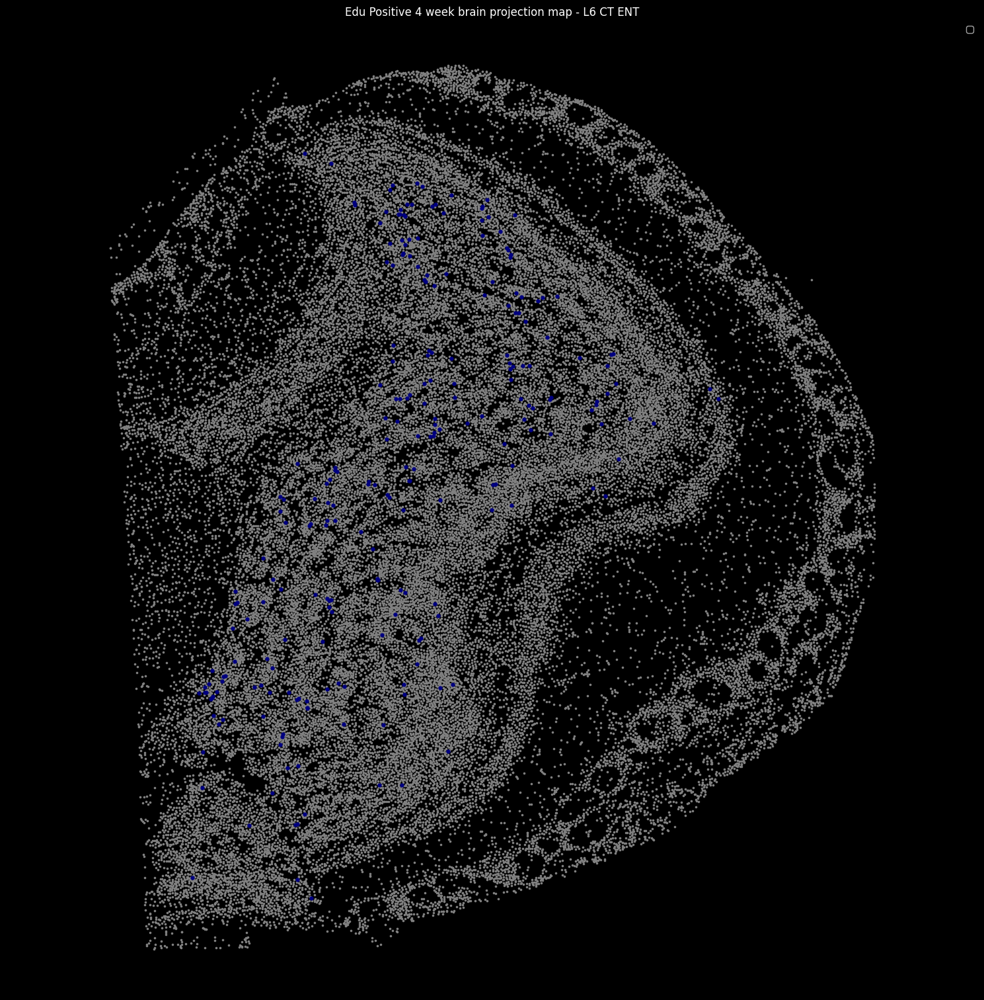

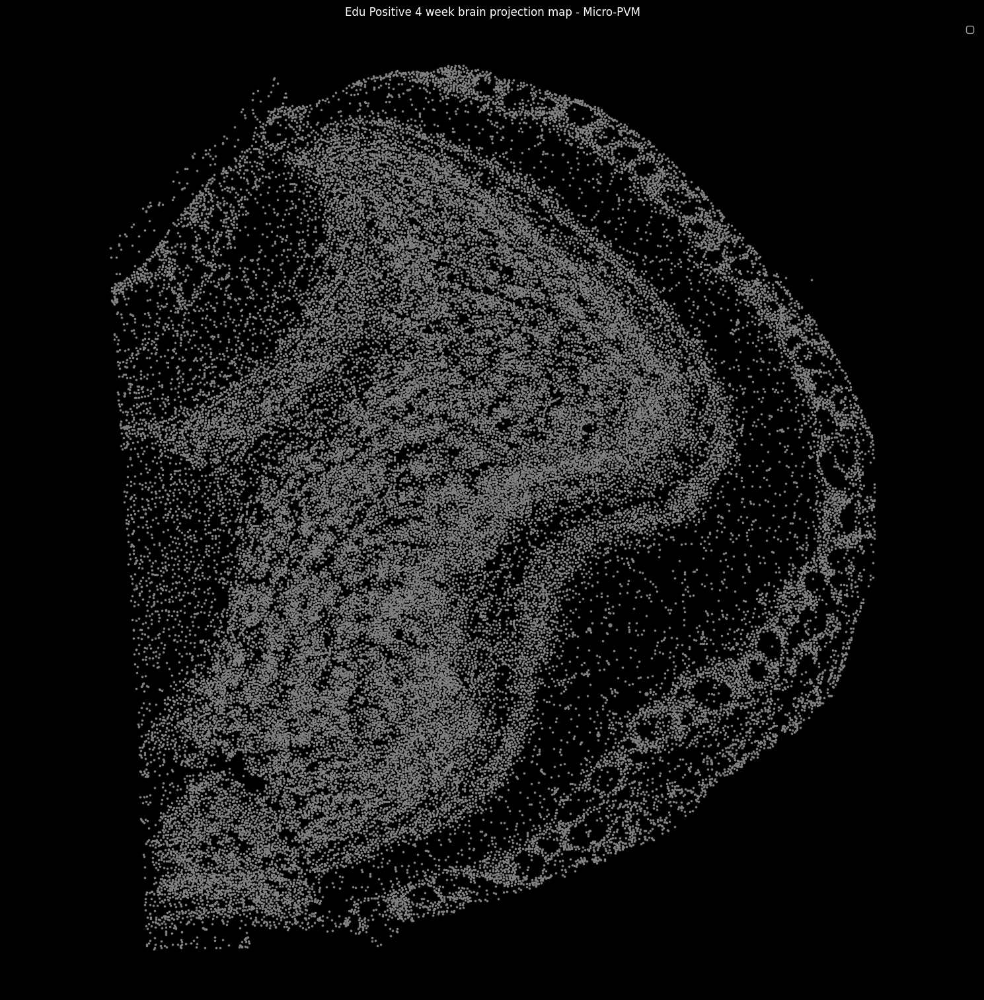

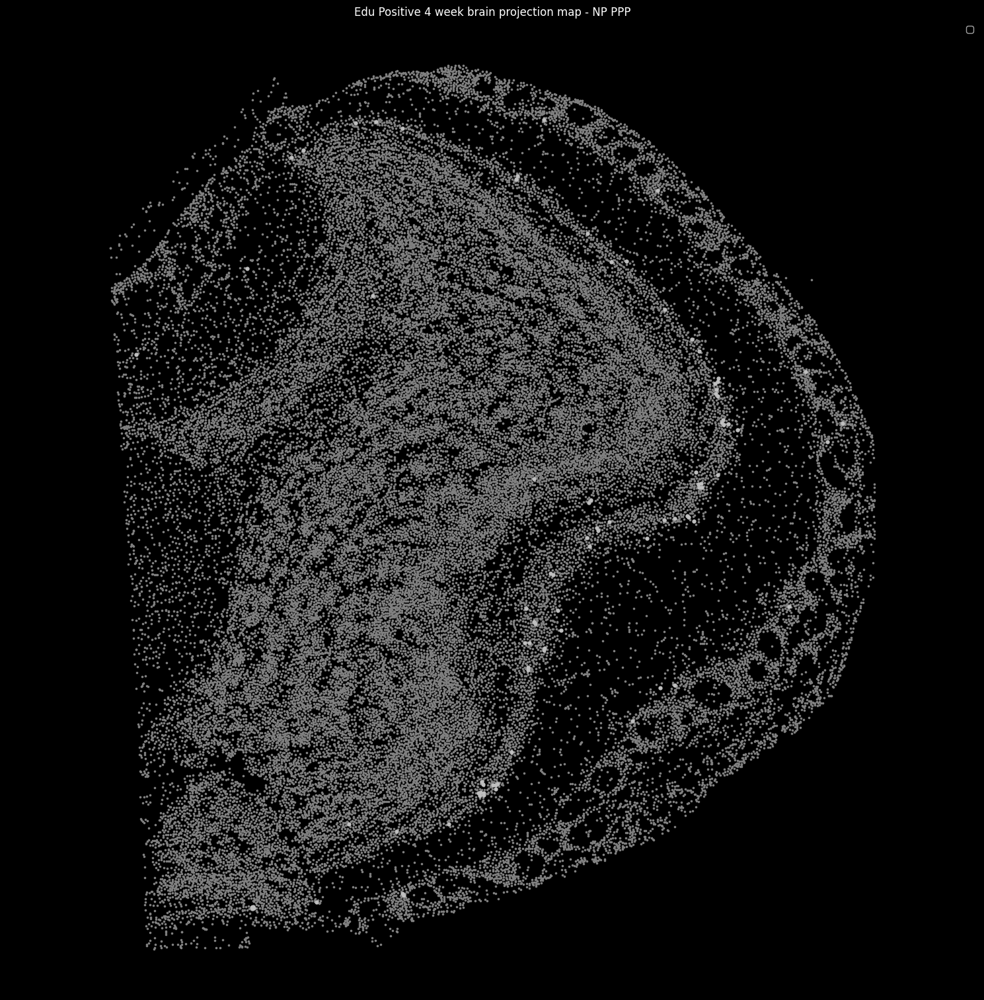

In [8]:
for cluster in adata_4_week_ob_edu_pos.obs['cluster_names'].unique():
    adata_4_week_ob_edu_pos.plot_cluster_scdata(group = 'cluster_names', clusters = [cluster],  ref = adata_4_week_ob, sbig = 50, ssm = 10)
    plt.title(f'Edu Positive 4 week brain projection map - {cluster}')